In [1]:
import sys

sys.path.append('..')

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

from utils.dataio import *
from utils.visualization import *

DATA_DIR = '../data/'
RESULTS_DIR = '../results_new/'

In [2]:
# Load configuration file.
config = load_config('../config.yaml')

### Numerical phantom

In [3]:
results_dir = os.path.join(RESULTS_DIR, 'numerical')

IP_gt = load_mat(os.path.join(DATA_DIR, 'IP.mat'))
SOS_gt = load_mat(os.path.join(DATA_DIR, 'SOS_easy.mat'))

IP_gt = standardize(IP_gt)
data_range_img = IP_gt.max() - IP_gt.min()

task_params = config['numerical']
IP_max, IP_min, SOS_max, SOS_min = task_params['IP_max'], task_params['IP_min'], task_params['SOS_max'], task_params['SOS_min']
norm_IP = Normalize(vmax=IP_max, vmin=IP_min)
norm_SOS = Normalize(vmax=SOS_max, vmin=SOS_min)

#### Ground Truth

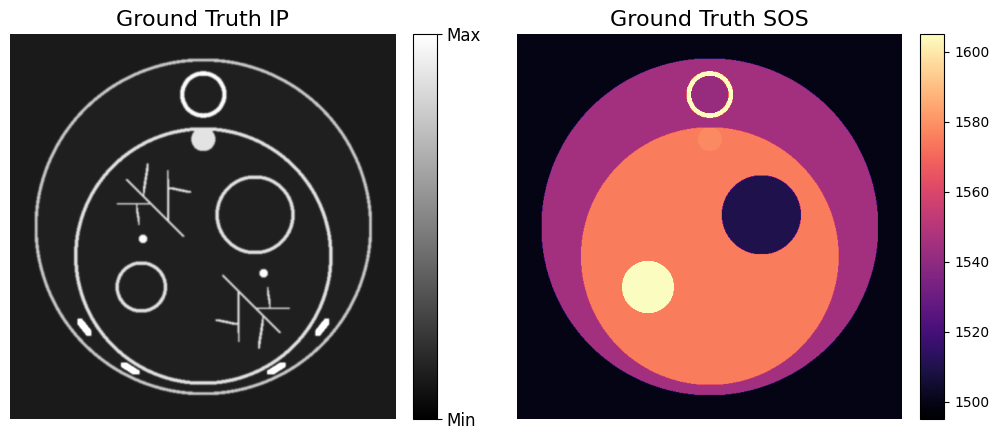

In [4]:
fig = plt.figure(figsize=(12, 5))
ax = plt.subplot(1,2,1)
plt.imshow(IP_gt, cmap='gray', norm=norm_IP)
plt.title('Ground Truth IP', fontsize=16)
plt.axis('off')
cax = fig.add_axes([ax.get_position().x1+0.015, ax.get_position().y0, 0.02, ax.get_position().height])
cb = plt.colorbar(cax=cax, norm=norm_IP)
cb.set_ticks([IP_max, IP_min])
cb.set_ticklabels(['Max', 'Min'], fontsize=12)

ax = plt.subplot(1,2,2)
plt.imshow(SOS_gt, cmap='magma', norm=norm_SOS)
plt.title('Ground Truth SOS', fontsize=16)
plt.axis('off')
cax = fig.add_axes([ax.get_position().x1+0.015, ax.get_position().y0, 0.02, ax.get_position().height])
cb = plt.colorbar(cax=cax, norm=norm_SOS)

#### Delay-and-sum

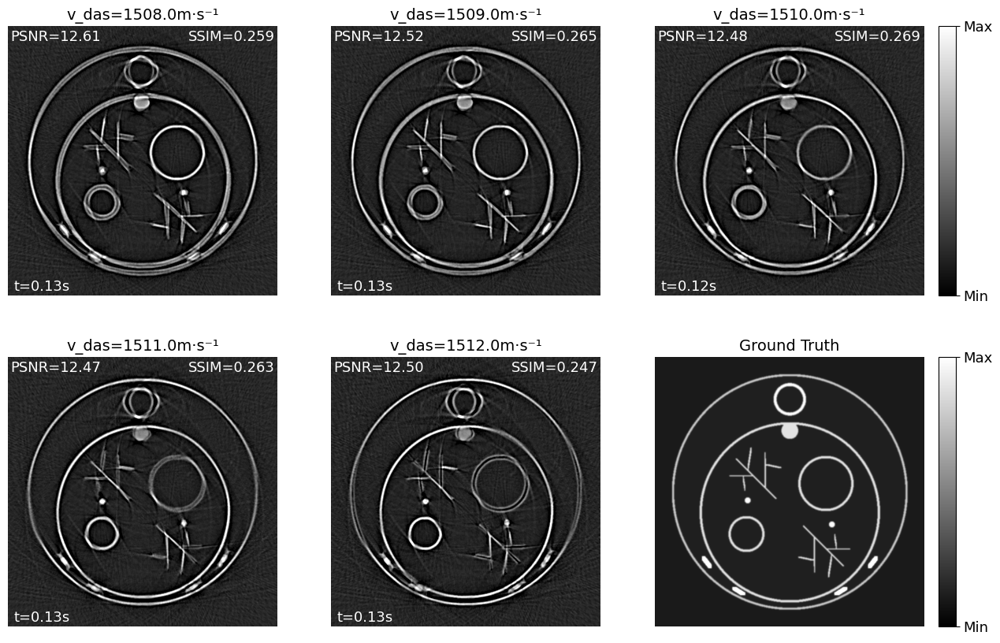

In [5]:
v_das_list = [1508, 1509, 1510, 1511, 1512]

fig = plt.figure(figsize=(15,10))
for idx, v_das in enumerate(v_das_list):
    IP_rec = load_mat(os.path.join(results_dir, 'DAS', 'v_das={:.1f}m·s⁻¹'.format(v_das), 'IP_rec.mat'))
    IP_rec = standardize(IP_rec)
    log = load_log(os.path.join(results_dir, 'DAS', 'v_das={:.1f}m·s⁻¹'.format(v_das), 'log.json'))
    ax = plt.subplot(2,3,idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('v_das={:.1f}m·s⁻¹'.format(v_das), fontsize=14)
    plt.title('PSNR={:.2f}'.format(psnr(IP_gt, IP_rec, data_range=data_range_img)), loc='left', x=0.01, y=0.92, fontsize=13, color='white')
    plt.title('SSIM={:.3f}'.format(ssim(IP_gt, IP_rec, data_range=data_range_img)), loc='right', x=0.99, y=0.92, fontsize=13, color='white')
    plt.text(s='t={:.2f}s'.format(log['time']), x=12, y=550, fontsize=13, color='white')
    if idx == 2:
        cax = fig.add_axes([ax.get_position().x1+0.012, ax.get_position().y0, 0.015, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=13)
    
ax = plt.subplot(2,3,6)
plt.imshow(IP_gt, cmap='gray', norm=norm_IP)
plt.axis('off')
plt.title('Ground Truth', fontsize=14)
cax = fig.add_axes([ax.get_position().x1+0.012, ax.get_position().y0, 0.015, ax.get_position().height])
cb = plt.colorbar(cax=cax, norm=norm_IP)
cb.set_ticks([IP_max, IP_min])
cb.set_ticklabels(['Max', 'Min'], fontsize=13)

#### Dual-SOS DAS

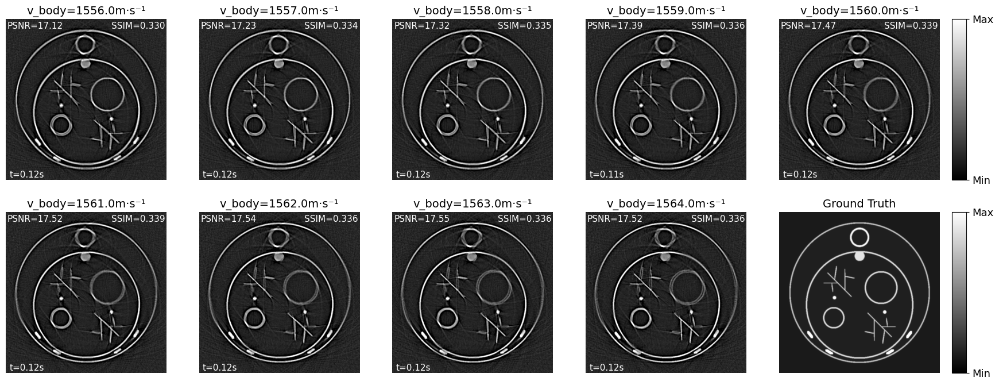

In [6]:
v_body_list = [1556, 1557, 1558, 1559, 1560, 1561, 1562, 1563, 1564]

fig = plt.figure(figsize=(21,8))
for idx, v_body in enumerate(v_body_list):
    IP_rec = load_mat(os.path.join(results_dir, 'Dual-SOS_DAS', 'v_body={:.1f}m·s⁻¹'.format(v_body), 'IP_rec.mat'))
    IP_rec = standardize(IP_rec)
    log = load_log(os.path.join(results_dir, 'Dual-SOS_DAS', 'v_body={:.1f}m·s⁻¹'.format(v_body), 'log.json'))
    ax = plt.subplot(2,5,idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('v_body={:.1f}m·s⁻¹'.format(v_body), fontsize=14)
    plt.title('PSNR={:.2f}'.format(psnr(IP_gt, IP_rec, data_range=data_range_img)), loc='left', x=0.01, y=0.91, fontsize=11, color='white')
    plt.title('SSIM={:.3f}'.format(ssim(IP_gt, IP_rec, data_range=data_range_img)), loc='right', x=0.99, y=0.91, fontsize=11, color='white')
    plt.text(s='t={:.2f}s'.format(log['time']), x=12, y=550, fontsize=11, color='white')
    if idx == 4:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=13)
    
ax = plt.subplot(2,5,10)
plt.imshow(IP_gt, cmap='gray', norm=norm_IP)
plt.axis('off')
plt.title('Ground Truth', fontsize=14)
cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
cb = plt.colorbar(cax=cax, norm=norm_IP)
cb.set_ticks([IP_max, IP_min])
cb.set_ticklabels(['Max', 'Min'], fontsize=13)

#### NF-APACT

Network structure (Positional encoding, number of hidden layers and hidden features).

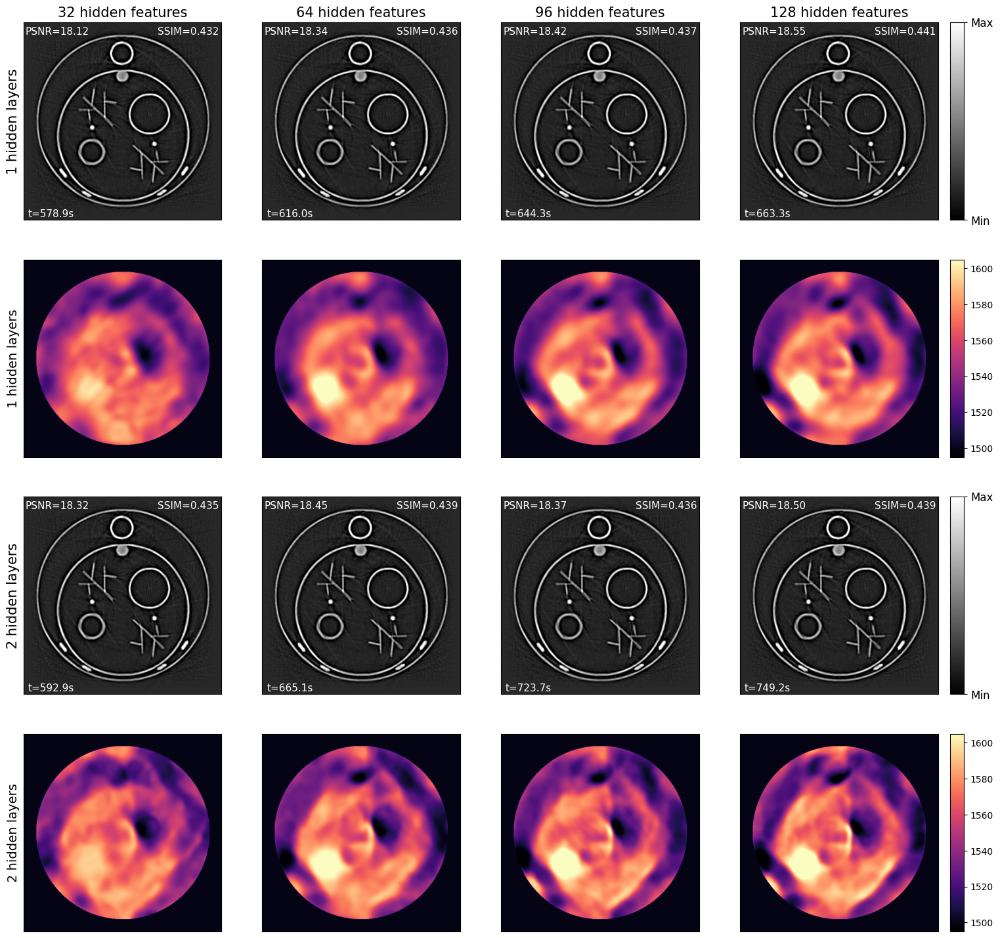

In [23]:
n_layers_list, n_hidden_fts_list = [1, 2], [32, 64, 96, 128]

fig = plt.figure(figsize=(18,18))
for i, n_hidden_fts in enumerate(n_hidden_fts_list):
    for j, n_layers in enumerate(n_layers_list):
        IP_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(32, n_layers, n_hidden_fts, 0, 1e-5, 40), 'IP_rec.mat'))
        SOS_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(32, n_layers, n_hidden_fts, 0, 1e-5, 40), 'SOS_rec.mat'))
        IP_rec = standardize(IP_rec)
        log = load_log(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(32, n_layers, n_hidden_fts, 0, 1e-5, 40), 'log.json'))
        ax = plt.subplot(2*len(n_layers_list),len(n_hidden_fts_list),i+1+len(n_hidden_fts_list)*2*j)
        plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
        plt.xticks([])
        plt.yticks([])
        plt.title('PSNR={:.2f}'.format(psnr(IP_gt, IP_rec, data_range=data_range_img)), loc='left', x=0.01, y=0.91, fontsize=11, color='white')
        plt.title('SSIM={:.3f}'.format(ssim(IP_gt, IP_rec, data_range=data_range_img)), loc='right', x=0.99, y=0.91, fontsize=11, color='white')
        plt.text(s='t={:.1f}s'.format(log['time']), x=12, y=550, fontsize=11, color='white')
        if j == 0:
            plt.title('{} hidden features'.format(n_hidden_fts), fontsize=15)
        if i == 0:
            plt.ylabel('{} hidden layers'.format(n_layers), fontsize=15)
        if (i+1) % len(n_hidden_fts_list) == 0:
            cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
            cb = plt.colorbar(cax=cax, norm=norm_IP)
            cb.set_ticks([IP_max, IP_min])
            cb.set_ticklabels(['Max', 'Min'], fontsize=12)
        
        ax = plt.subplot(2*len(n_layers_list),len(n_hidden_fts_list),i+1+len(n_hidden_fts_list)*(1+2*j))
        plt.imshow(SOS_rec, cmap='magma', norm=norm_SOS)
        plt.xticks([])
        plt.yticks([])
        if i == 0:
            plt.ylabel('{} hidden layers'.format(n_layers), fontsize=14)
        if (i+1) % len(n_hidden_fts_list) == 0:
            cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
            cb = plt.colorbar(cax=cax, norm=norm_SOS)
            # cb.set_ticks([IP_max, IP_min])
    

Number of delays.

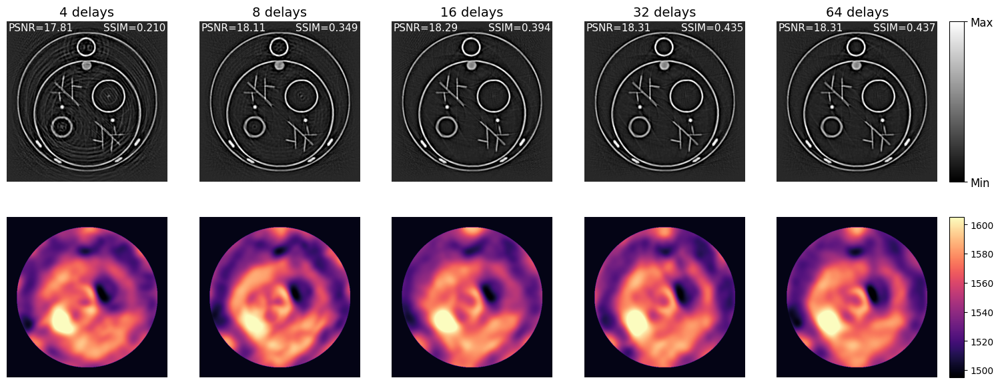

In [ ]:
n_delays_list = [4, 8, 16, 32, 64]

fig = plt.figure(figsize=(18,7))
for idx, n_delays in enumerate(n_delays_list):
    IP_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(n_delays, 1, 64, 0, 1e-5, 40), 'IP_rec.mat'))
    SOS_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(n_delays, 1, 64, 0, 1e-5, 40), 'SOS_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,len(n_delays_list),idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('PSNR={:.2f}'.format(psnr(IP_gt, IP_rec, data_range=data_range_img)), loc='left', x=0.01, y=0.91, fontsize=11, color='white')
    plt.title('SSIM={:.3f}'.format(ssim(IP_gt, IP_rec, data_range=data_range_img)), loc='right', x=0.99, y=0.91, fontsize=11, color='white')
    plt.title('{} delays'.format(n_delays), fontsize=14)
    if (idx+1) % len(n_delays_list) == 0:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=12)
    
    ax = plt.subplot(2,len(n_delays_list),idx+1+len(n_delays_list))
    plt.imshow(SOS_rec, cmap='magma', norm=norm_SOS)
    plt.axis('off')
    if (idx+1) % len(n_delays_list) == 0:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_SOS)
        # cb.set_ticks([IP_max, IP_min])
    

### Leaf Phantom

In [ ]:
results_dir = os.path.join(RESULTS_DIR, 'phantom')

task_params = config['phantom']
IP_max, IP_min, SOS_max, SOS_min = task_params['IP_max'], task_params['IP_min'], task_params['SOS_max'], task_params['SOS_min']
norm_IP = Normalize(vmax=IP_max, vmin=IP_min)
norm_SOS = Normalize(vmax=SOS_max, vmin=SOS_min)

#### Delay-and-sum

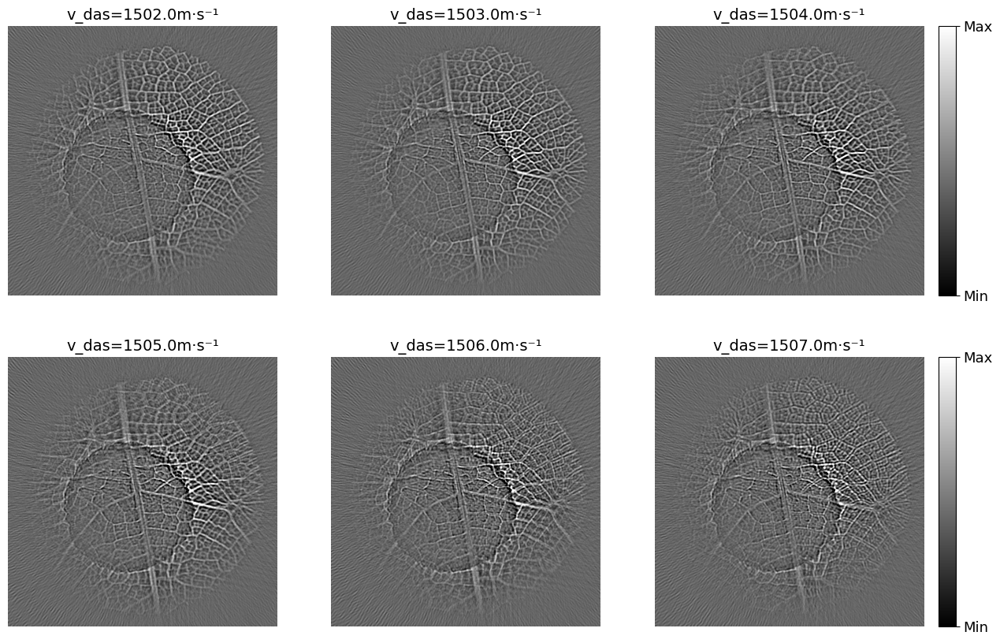

In [ ]:
v_das_list = [1502, 1503, 1504, 1505, 1506, 1507]

fig = plt.figure(figsize=(15,10))
for idx, v_das in enumerate(v_das_list):
    IP_rec = load_mat(os.path.join(results_dir, 'DAS', 'v_das={:.1f}m·s⁻¹'.format(v_das), 'IP_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,3,idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('v_das={:.1f}m·s⁻¹'.format(v_das), fontsize=14)
    if (idx+1) % 3 == 0:
        cax = fig.add_axes([ax.get_position().x1+0.012, ax.get_position().y0, 0.015, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=13)

#### Dual-SOS DAS

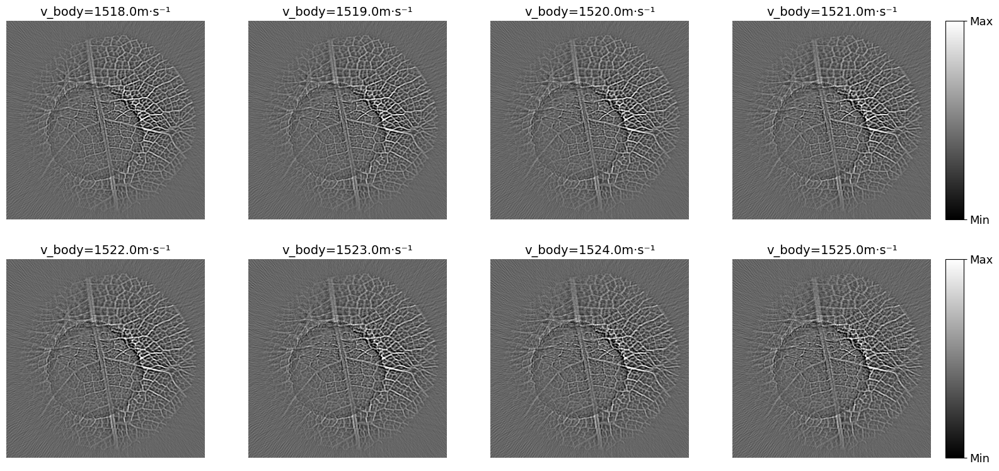

In [ ]:
v_body_list = [1518, 1519, 1520, 1521, 1522, 1523, 1524, 1525]

fig = plt.figure(figsize=(19,9))
for idx, v_body in enumerate(v_body_list):
    IP_rec = load_mat(os.path.join(results_dir, 'Dual-SOS_DAS', 'v_body={:.1f}m·s⁻¹'.format(v_body), 'IP_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,4,idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('v_body={:.1f}m·s⁻¹'.format(v_body), fontsize=14)
    if (idx+1) % 4 == 0:
        cax = fig.add_axes([ax.get_position().x1+0.012, ax.get_position().y0, 0.015, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=13)

#### NF-APACT

Network structure (Positional encoding, number of hidden layers and hidden features).

### _In vivo_ Mouse Liver

In [ ]:
results_dir = os.path.join(RESULTS_DIR, 'in_vivo')

task_params = config['in_vivo']
IP_max, IP_min, SOS_max, SOS_min = task_params['IP_max'], task_params['IP_min'], task_params['SOS_max'], task_params['SOS_min']
norm_IP = Normalize(vmax=IP_max, vmin=IP_min)
norm_SOS = Normalize(vmax=SOS_max, vmin=SOS_min)

#### Delay-and-sum

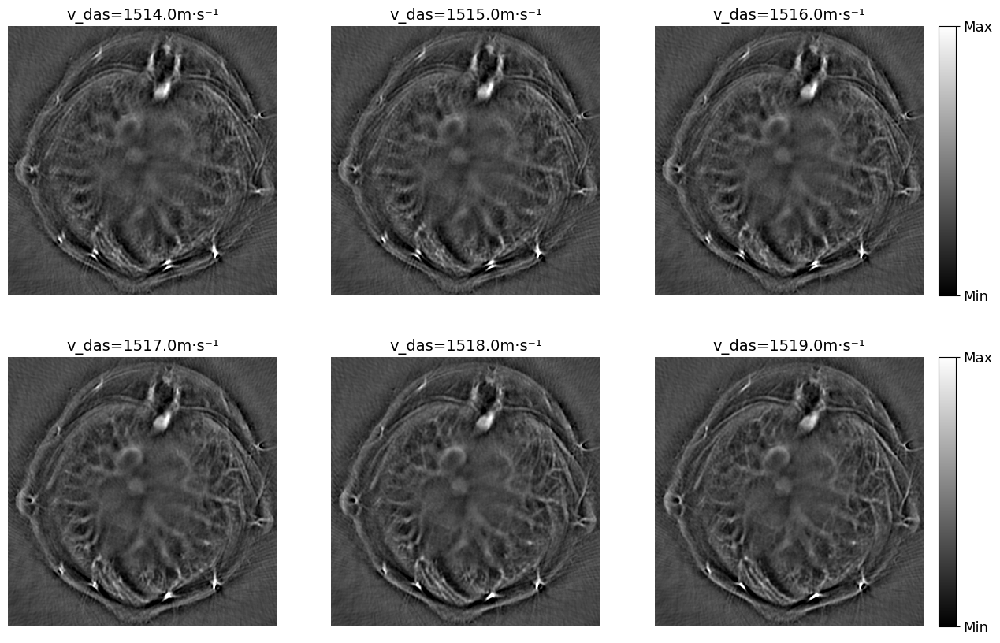

In [ ]:
v_das_list = [1514, 1515, 1516, 1517, 1518, 1519]

fig = plt.figure(figsize=(15,10))
for idx, v_das in enumerate(v_das_list):
    IP_rec = load_mat(os.path.join(results_dir, 'DAS', 'v_das={:.1f}m·s⁻¹'.format(v_das), 'IP_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,3,idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('v_das={:.1f}m·s⁻¹'.format(v_das), fontsize=14)
    if (idx+1) % 3 == 0:
        cax = fig.add_axes([ax.get_position().x1+0.012, ax.get_position().y0, 0.015, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=13)

#### Dual-SOS DAS

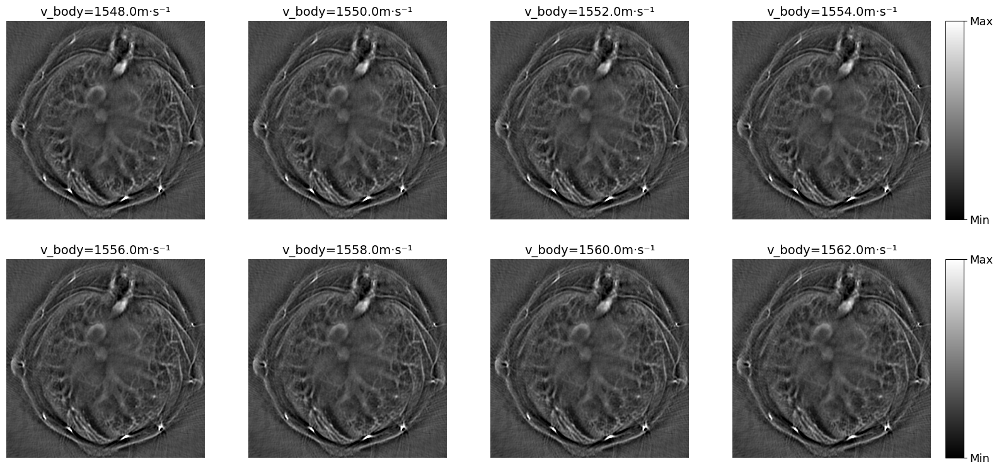

In [ ]:
v_body_list = [1548, 1550, 1552, 1554, 1556, 1558, 1560, 1562]

fig = plt.figure(figsize=(19,9))
for idx, v_body in enumerate(v_body_list):
    IP_rec = load_mat(os.path.join(results_dir, 'Dual-SOS_DAS', 'v_body={:.1f}m·s⁻¹'.format(v_body), 'IP_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,4,idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('v_body={:.1f}m·s⁻¹'.format(v_body), fontsize=14)
    if (idx+1) % 4 == 0:
        cax = fig.add_axes([ax.get_position().x1+0.012, ax.get_position().y0, 0.015, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=13)

#### NF-APACT

Network structure (Positional encoding, number of hidden layers and hidden features).

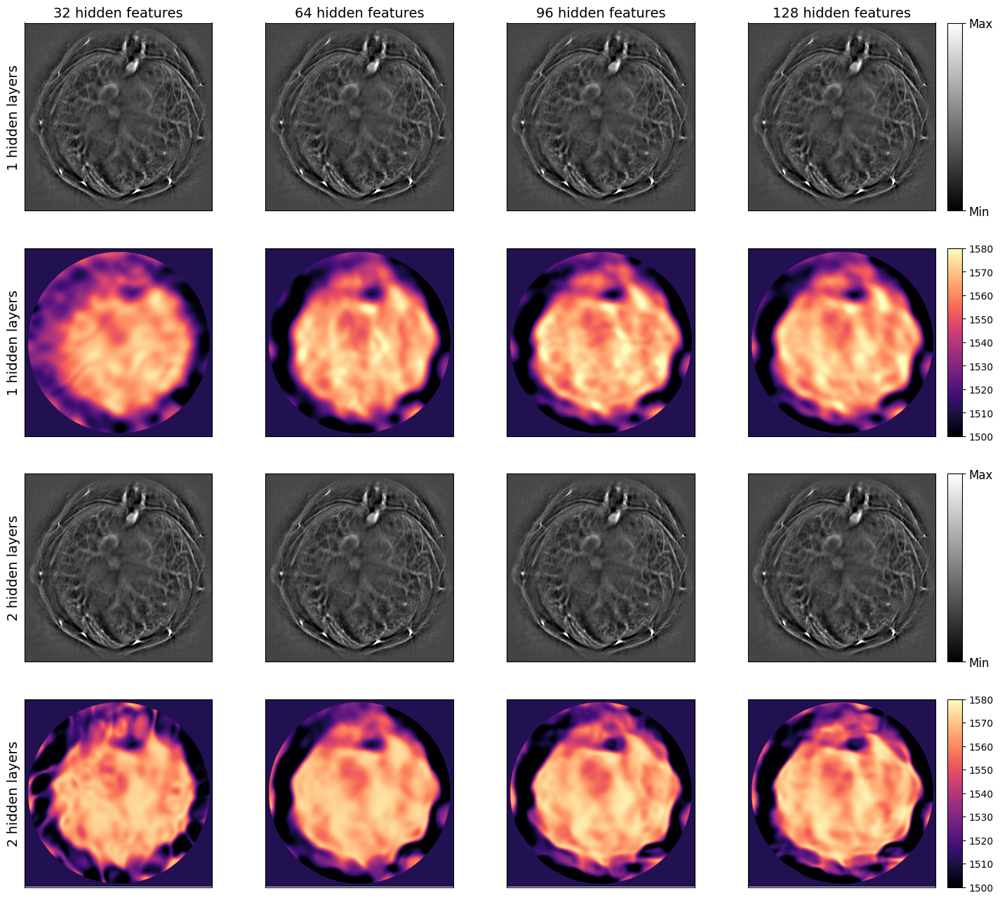

In [ ]:
n_layers_list, n_hidden_fts_list = [1, 2], [32, 64, 96, 128]

fig = plt.figure(figsize=(17,16))
for i, n_hidden_fts in enumerate(n_hidden_fts_list):
    for j, n_layers in enumerate(n_layers_list):
        IP_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(16, n_layers, n_hidden_fts, 0, 2e-5, 40), 'IP_rec.mat'))
        SOS_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_TV={:.1e}_lr={:.1e}_{}iters'.format(16, n_layers, n_hidden_fts, 0, 2e-5, 40), 'SOS_rec.mat'))
        IP_rec = standardize(IP_rec)
        ax = plt.subplot(2*len(n_layers_list),len(n_hidden_fts_list),i+1+len(n_hidden_fts_list)*2*j)
        plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
        plt.xticks([])
        plt.yticks([])
        if j == 0:
            plt.title('{} hidden features'.format(n_hidden_fts), fontsize=14)
        if i == 0:
            plt.ylabel('{} hidden layers'.format(n_layers), fontsize=14)
        if (i+1) % len(n_hidden_fts_list) == 0:
            cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
            cb = plt.colorbar(cax=cax, norm=norm_IP)
            cb.set_ticks([IP_max, IP_min])
            cb.set_ticklabels(['Max', 'Min'], fontsize=12)
        
        ax = plt.subplot(2*len(n_layers_list),len(n_hidden_fts_list),i+1+len(n_hidden_fts_list)*(1+2*j))
        plt.imshow(SOS_rec, cmap='magma', norm=norm_SOS)
        plt.xticks([])
        plt.yticks([])
        if i == 0:
            plt.ylabel('{} hidden layers'.format(n_layers), fontsize=14)
        if (i+1) % len(n_hidden_fts_list) == 0:
            cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
            cb = plt.colorbar(cax=cax, norm=norm_SOS)
            # cb.set_ticks([IP_max, IP_min])
    

Learning rate.

Number of delays.

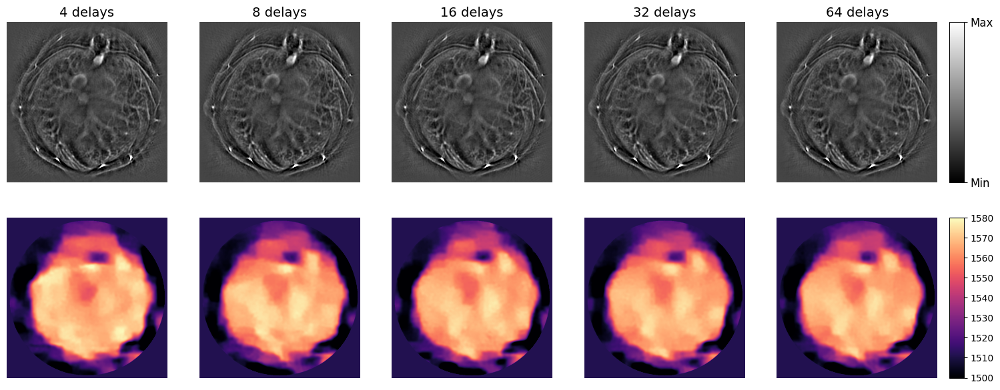

In [ ]:
n_delays_list = [4, 8, 16, 32, 64]

fig = plt.figure(figsize=(18,7))
for idx, n_delays in enumerate(n_delays_list):
    IP_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_PE={}_TV={:.1e}_lr={:.1e}_{}iters'.format(n_delays, 1, 96, 4, 1e-4, 2e-5, 40), 'IP_rec.mat'))
    SOS_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_PE={}_TV={:.1e}_lr={:.1e}_{}iters'.format(n_delays, 1, 96, 4, 1e-4, 2e-5, 40), 'SOS_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,len(n_delays_list),idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('{} delays'.format(n_delays), fontsize=14)
    if (idx+1) % len(n_delays_list) == 0:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=12)
    
    ax = plt.subplot(2,len(n_delays_list),idx+1+len(n_delays_list))
    plt.imshow(SOS_rec, cmap='magma', norm=norm_SOS)
    plt.axis('off')
    if (idx+1) % len(n_delays_list) == 0:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.012, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_SOS)
        # cb.set_ticks([IP_max, IP_min])
    

TV Regularization weight on SOS.

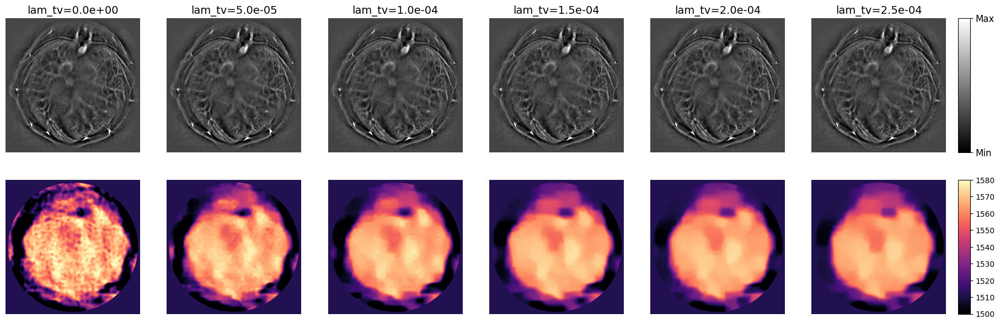

In [ ]:
lam_tv_list = [0, 0.5e-4, 1e-4, 1.5e-4, 2e-4, 2.5e-4]

fig = plt.figure(figsize=(22,7))
for idx, lam_tv in enumerate(lam_tv_list):
    IP_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_PE={}_TV={:.1e}_lr={:.1e}_{}iters'.format(16, 1, 96, 4, lam_tv, 2e-5, 40), 'IP_rec.mat'))
    SOS_rec = load_mat(os.path.join(results_dir, 'NF-APACT', '{}delays_{}lyrs_{}fts_PE={}_TV={:.1e}_lr={:.1e}_{}iters'.format(16, 1, 96, 4, lam_tv, 2e-5, 40), 'SOS_rec.mat'))
    IP_rec = standardize(IP_rec)
    ax = plt.subplot(2,len(lam_tv_list),idx+1)
    plt.imshow(IP_rec, cmap='gray', norm=norm_IP)
    plt.axis('off')
    plt.title('lam_tv={:.1e}'.format(lam_tv), fontsize=14)
    if (idx+1) % len(lam_tv_list) == 0:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.01, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_IP)
        cb.set_ticks([IP_max, IP_min])
        cb.set_ticklabels(['Max', 'Min'], fontsize=12)
    
    ax = plt.subplot(2,len(lam_tv_list),idx+1+len(lam_tv_list))
    plt.imshow(SOS_rec, cmap='magma', norm=norm_SOS)
    plt.axis('off')
    if (idx+1) % len(lam_tv_list) == 0:
        cax = fig.add_axes([ax.get_position().x1+0.01, ax.get_position().y0, 0.01, ax.get_position().height])
        cb = plt.colorbar(cax=cax, norm=norm_SOS)
        # cb.set_ticks([IP_max, IP_min])
    